In [1]:
#import dill
#dill.load_session('EDA.db')

In [2]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
from wordcloud import WordCloud,STOPWORDS
from textblob import TextBlob
from plotly import tools
from plotly.offline import iplot
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)
import plotly.graph_objs as go
from collections import defaultdict
import plotly.express as px

In [3]:
reviews = pd.read_json(r'C:\Users\dfota\OneDrive\Έγγραφα\Thesis Project\Amazon-Game-Reviews-Analysis\Data\MergedDataset.json')

In [4]:
#function to return sentiment value based on the overall ratings
def f(row):        

    if row['overall'] == 3.0:
        val = 'Neutral'
    elif row['overall'] == 1.0 or row['overall'] == 2.0:
        val = 'Negative'
    elif row['overall'] == 4.0 or row['overall'] == 5.0:
        val = 'Positive'
    else:
        val = -1
    return val

In [5]:
reviews['sentiment'] = reviews.apply(f, axis=1)
reviews.head()

,asin,overall,reviewTime,title,category,imageURLHighRes,reviews,sentiment
0,B00000DMAN,5,"11 28, 1999",The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"This game is a lot of fun, with a creepy atmos...",Positive
1,B00000DMAN,4,"03 5, 2003",The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,This was not the best mystery/adventure game I...,Positive
2,B00000DMAN,4,"02 13, 2001",The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"This was a pretty good game, but not a great g...",Positive
3,B00000DMAN,4,"08 19, 2000",The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,We stopped watching the series (lack of time) ...,Positive
4,B00000DMAN,5,"07 27, 2000",The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"As a fan of Myst and Riven, I would not put th...",Positive


In [6]:
reviews['sentiment'].value_counts()

Positive    81380
Negative    16061
Neutral     14141
Name: sentiment, dtype: int64

In [7]:
reviews.groupby('overall').count()['asin'].iplot(kind='bar', yTitle='Count', linecolor='black', opacity=0.8,
                                                           title='Bar chart of Platforms', xTitle='Division Name')

In [8]:
reviews.groupby('sentiment').count()['asin'].iplot(kind='bar', yTitle='Count', linecolor='black', opacity=0.8,
                                                           title='Bar chart of Platforms', xTitle='Division Name')

In [9]:
# new data frame which has date and year
new = reviews["reviewTime"].str.split(",", n = 1, expand = True) 
  
# making separate date column from new data frame 
reviews["date"]= new[0] 
  
# making separate year column from new data frame 
reviews["year"]= new[1] 

reviews=reviews.drop(['reviewTime'], axis=1)
reviews.head()

,asin,overall,title,category,imageURLHighRes,reviews,sentiment,date,year
0,B00000DMAN,5,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"This game is a lot of fun, with a creepy atmos...",Positive,11 28,1999
1,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,This was not the best mystery/adventure game I...,Positive,03 5,2003
2,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"This was a pretty good game, but not a great g...",Positive,02 13,2001
3,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,We stopped watching the series (lack of time) ...,Positive,08 19,2000
4,B00000DMAN,5,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"As a fan of Myst and Riven, I would not put th...",Positive,07 27,2000


In [10]:
new1 = reviews["date"].str.split(" ", n = 1, expand = True) 
  
# adding month to the main dataset 
reviews["month"]= new1[0] 
  
# adding day to the main dataset 
reviews["day"]= new1[1] 

reviews=reviews.drop(['date'], axis=1)
reviews.head()

,asin,overall,title,category,imageURLHighRes,reviews,sentiment,year,month,day
0,B00000DMAN,5,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"This game is a lot of fun, with a creepy atmos...",Positive,1999,11,28
1,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,This was not the best mystery/adventure game I...,Positive,2003,03,5
2,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"This was a pretty good game, but not a great g...",Positive,2001,02,13
3,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,We stopped watching the series (lack of time) ...,Positive,2000,08,19
4,B00000DMAN,5,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"As a fan of Myst and Riven, I would not put th...",Positive,2000,07,27


In [11]:
my_max = reviews['year'].astype(str).astype(int).loc[reviews['year'].astype(str).astype(int).idxmax()]
print(my_max)

2018


In [12]:
my_min = reviews['year'].astype(str).astype(int).loc[reviews['year'].astype(str).astype(int).idxmin()]
print(my_min)

1999


In [13]:
reviews['year'] = pd.to_numeric(reviews['year'])

In [14]:
reviews.groupby(['year','sentiment'])['sentiment'].count().unstack().iplot(kind='line', yTitle='Count', linecolor='black', opacity=0.8,
                                                           title='Bar chart of Platforms', xTitle='Division Name')

In [15]:
day=pd.DataFrame(reviews.groupby('day')['reviews'].count()).reset_index()
day['day']=day['day'].astype('int64')
day.sort_values(by=['day'])

fig = day.iplot(kind='bar', x = 'day', y = 'reviews', yTitle='Number of Reviews', linecolor='black', opacity=0.8,
                                                           title='Bar chart of Platforms', xTitle='Day')

In [16]:
fig = px.histogram(reviews, x="year", title = 'Reviews per year')
fig.show()

In [17]:
reviews.groupby('category').count()['asin'].iplot(kind='bar', yTitle='Count', linecolor='black', opacity=0.8,
                                                           title='Bar chart of Platforms', xTitle='Division Name')

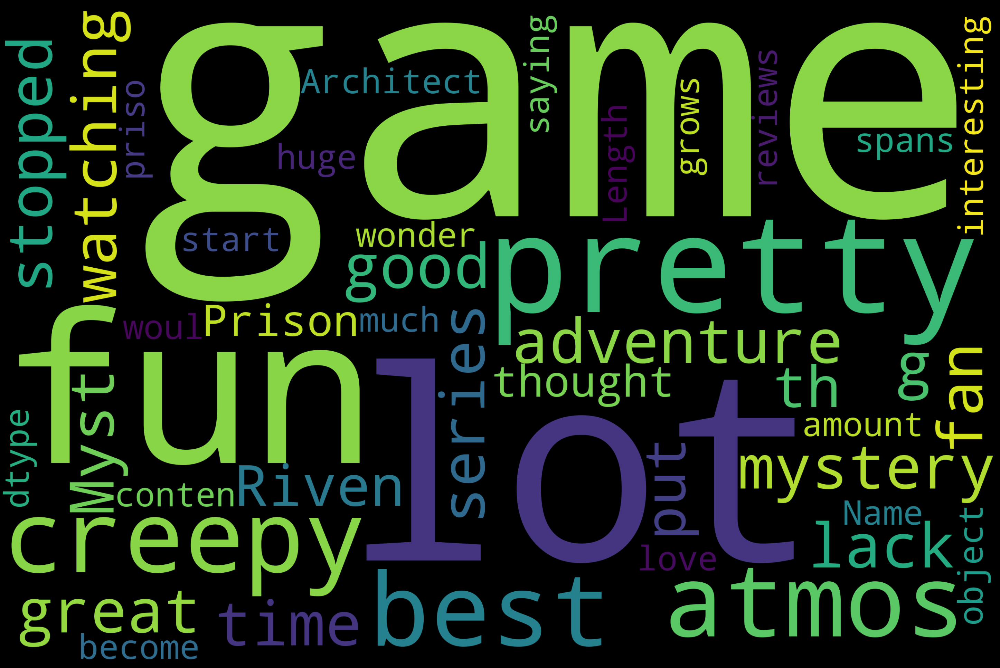

In [18]:
text = reviews["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [19]:
review_pos = reviews[reviews["sentiment"]=='Positive']
review_neu = reviews[reviews["sentiment"]=='Neutral']
review_neg = reviews[reviews["sentiment"]=='Negative']

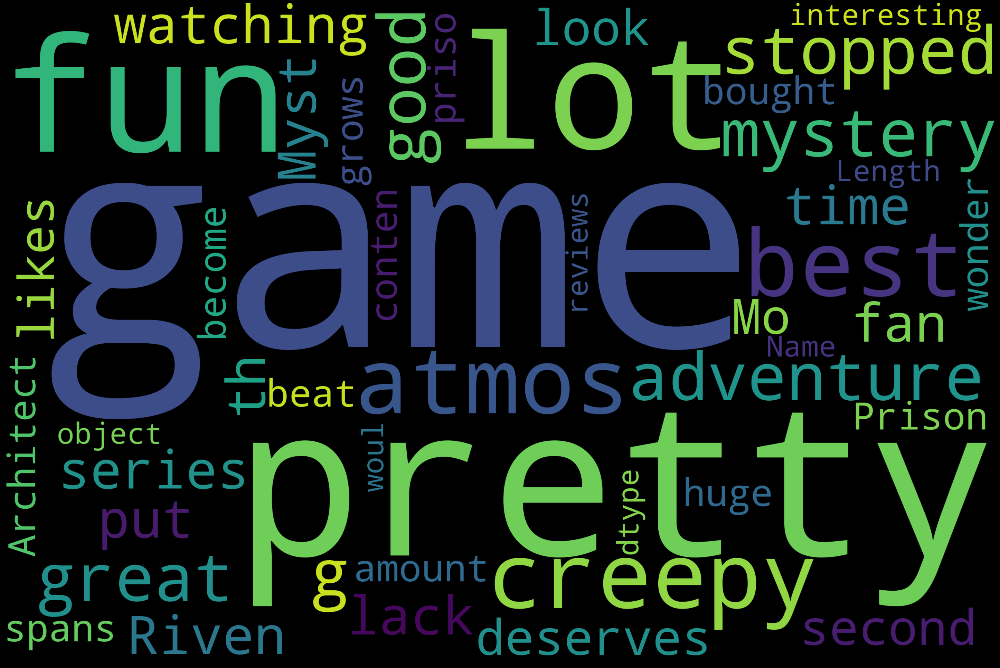

In [20]:
text = review_pos["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

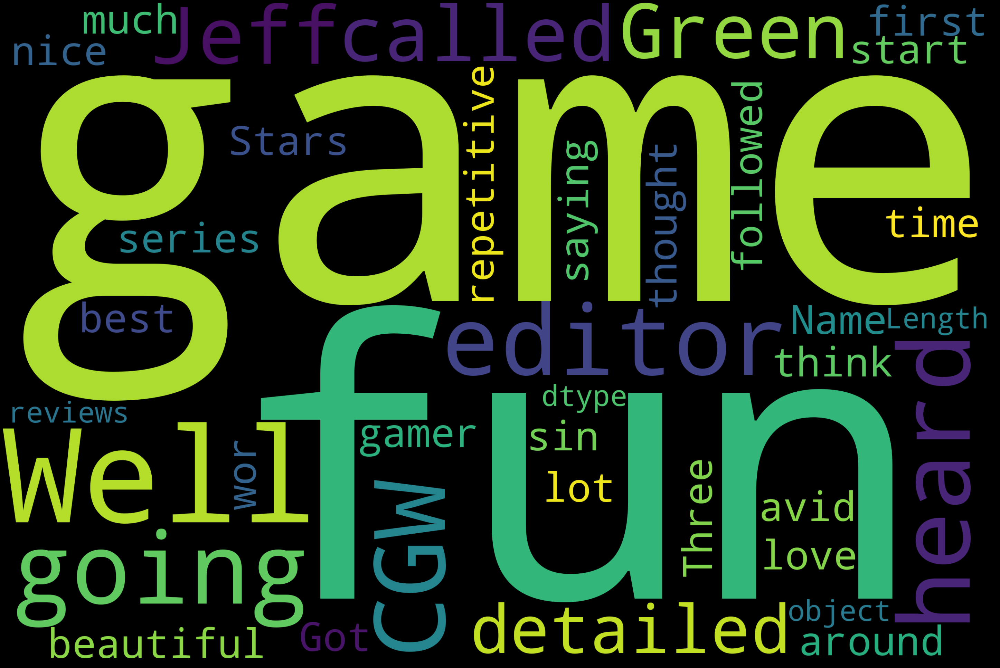

In [21]:
text = review_neu["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

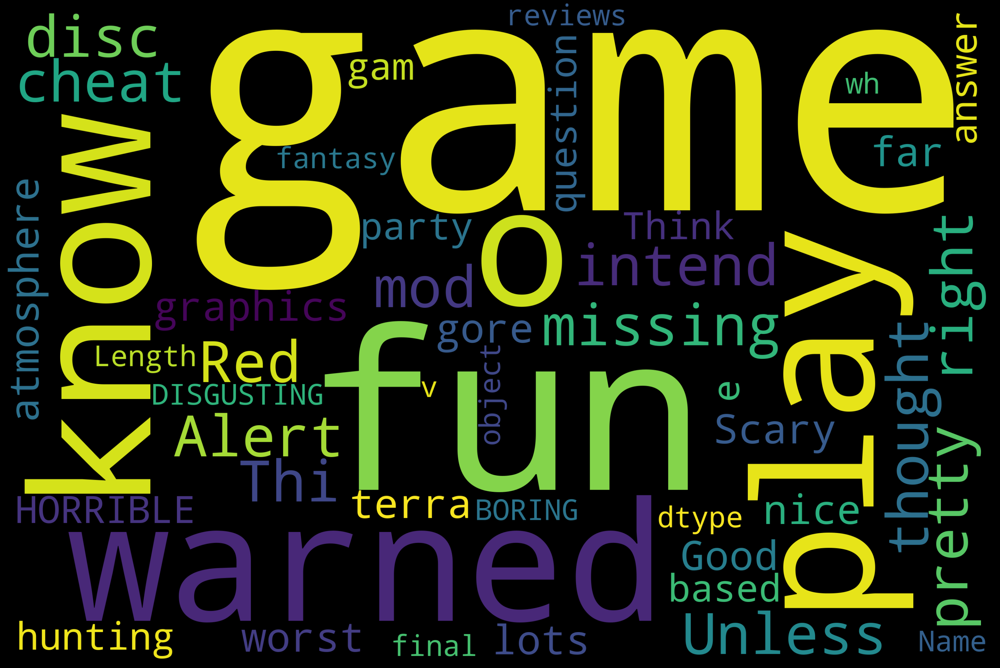

In [22]:
text = review_neg["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [23]:
reviews["review_word_count"] = reviews["reviews"].apply(lambda reviews: len(reviews.split()))

In [24]:
reviews['polarity'] = reviews['reviews'].map(lambda text: TextBlob(text).sentiment.polarity)

In [25]:
reviews['review_len'] = reviews['reviews'].astype(str).apply(len)

In [26]:
reviews.describe()

,overall,year,review_word_count,polarity,review_len
count,111582.000000,111582.000000,111582.000000,111582.000000,111582.000000
mean,4.024314,2012.655222,166.380940,0.132812,912.570128
std,1.271989,3.757155,271.353203,0.238873,1516.403975
min,1.000000,1999.000000,1.000000,-1.000000,4.000000
25%,3.000000,2011.000000,24.000000,0.002308,128.000000
50%,5.000000,2014.000000,67.000000,0.106088,355.000000
75%,5.000000,2015.000000,191.000000,0.225000,1033.000000
max,5.000000,2018.000000,5672.000000,1.000000,32670.000000


In [53]:
reviews['review_len'].iplot(
    kind='hist',
    bins=2000,
    xTitle='review length',
    linecolor='black',
    yTitle='count',
    title='Review Text Length Distribution')

In [28]:
reviews['review_word_count'].iplot(
    kind='hist',
    bins=200,
    xTitle='word count',
    linecolor='black',
    yTitle='count',
    title='Review Text Word Count Distribution')

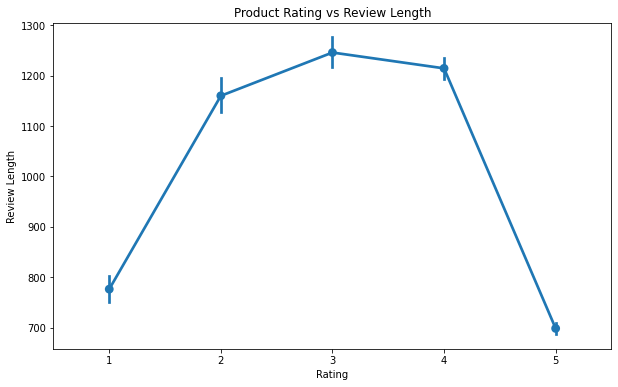

In [29]:
plt.figure(figsize=(10, 6))
sns.pointplot(x = "overall", y = "review_len", data = reviews)
plt.xlabel("Rating")
plt.ylabel("Review Length")
plt.title("Product Rating vs Review Length")
plt.show()

In [30]:
reviews['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

In [31]:
reviews['sentiment'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

In [32]:
reviews.head()

,asin,overall,title,category,imageURLHighRes,reviews,sentiment,year,month,day,review_word_count,polarity,review_len
0,B00000DMAN,5,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"This game is a lot of fun, with a creepy atmos...",Positive,1999,11,28,115,0.202216,633
1,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,This was not the best mystery/adventure game I...,Positive,2003,03,5,248,0.042172,1352
2,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"This was a pretty good game, but not a great g...",Positive,2001,02,13,185,0.113542,964
3,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,We stopped watching the series (lack of time) ...,Positive,2000,08,19,283,0.015257,1556
4,B00000DMAN,5,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"As a fan of Myst and Riven, I would not put th...",Positive,2000,07,27,226,-0.003880,1224


Text(0, 0.5, 'Number of Reviews')

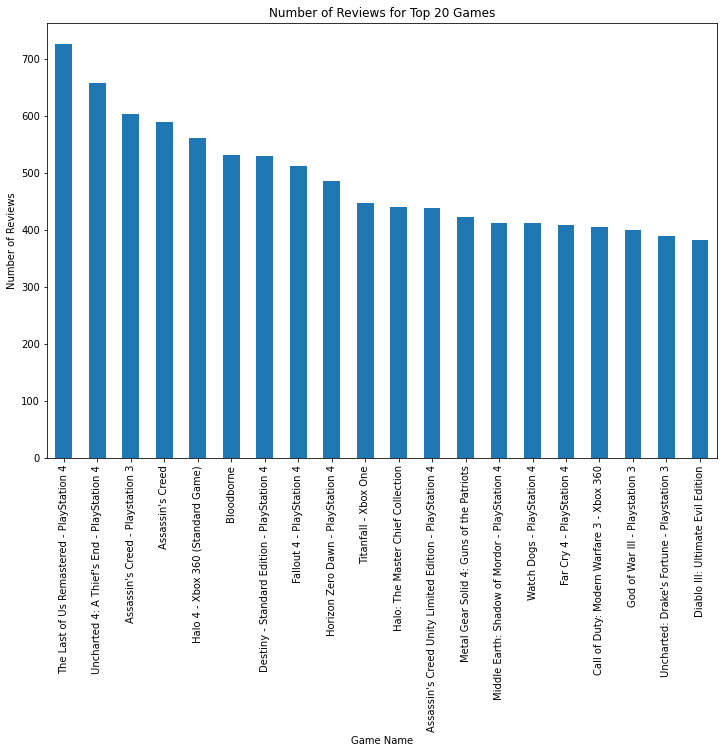

In [33]:
titles = reviews["title"].value_counts()
plt.figure(figsize=(12,8))
titles[:20].plot(kind='bar')
plt.title("Number of Reviews for Top 20 Games")
plt.xlabel('Game Name')
plt.ylabel('Number of Reviews')

Text(0, 0.5, 'Number of Reviews')

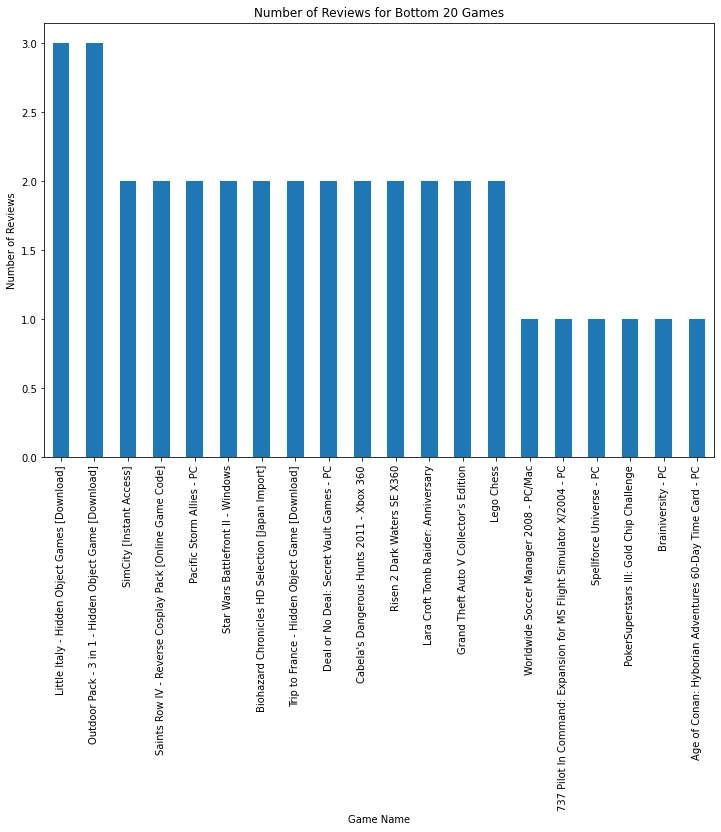

In [34]:
titles = reviews["title"].value_counts()
plt.figure(figsize=(12,8))
titles[-20:].plot(kind='bar')
plt.title("Number of Reviews for Bottom 20 Games")
plt.xlabel('Game Name')
plt.ylabel('Number of Reviews')

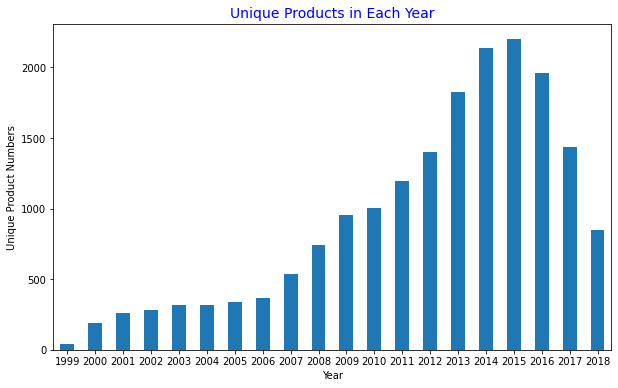

year
1999      40
2000     193
2001     262
2002     283
2003     319
2004     315
2005     335
2006     365
2007     539
2008     745
2009     955
2010    1001
2011    1194
2012    1404
2013    1826
2014    2134
2015    2200
2016    1959
2017    1438
2018     846
Name: asin, dtype: int64


In [35]:
# How many unique products in each year?
unique_prod = reviews.groupby('year')['asin'].nunique()

# Plot unique product numbers in each year
plt.figure(figsize = (10,6))
unique_prod.plot(kind='bar', rot =0)
plt.title('Unique Products in Each Year', color = 'b', size = 14)
plt.xlabel('Year')
plt.ylabel('Unique Product Numbers')
plt.show()

# Print unique product numbers in each year
print(unique_prod)


In [36]:
product_pol = reviews.groupby('title')['polarity'].agg([np.mean])
product_pol.columns = ['polarity']
product_pol = product_pol.sort_values('polarity', ascending=False)
product_pol = product_pol.head(20)
product_pol

,polarity
title,
Pro Evolution Soccer 2016 - PlayStation 3 Standard Edition,0.625000
Delicious - Emily's Honeymoon Cruise Platinum Edition [Download],0.613889
Lords of the Fallen Collector's Edition - PlayStation 4,0.569619
Ultimate Action Triple Pack - PlayStation 3,0.506465
The Borderlands 2 &amp; Dishonored Bundle - PlayStation 3,0.506015
TRON: Evolution Collector's Edition - Playstation 3,0.503824
Capcom Essentials,0.484477
Borderlands Triple Pack - Xbox 360,0.478363
Fallout 3 &amp; Oblivion Double Pack - Xbox 360,0.473555


<Figure size 720x432 with 0 Axes>

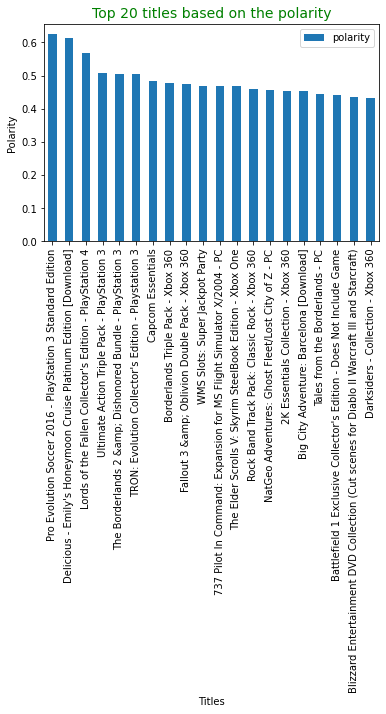

In [37]:
plt.figure(figsize = (10,6))
product_pol.plot(kind='bar')
plt.title('Top 20 titles based on the polarity', color = 'g', size = 14)
plt.xlabel('Titles')
plt.ylabel('Polarity')
plt.show()

In [38]:
#gram generation
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(" ") if token != "" if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [" ".join(ngram) for ngram in ngrams]

In [39]:
#horizontal bar chart
def horizontal_bar_chart(df, color):
    trace = go.Bar(
        y=df["word"].values[::-1],
        x=df["wordcount"].values[::-1],
        showlegend=False,
        orientation = 'h',
        marker=dict(
            color=color,
        ),
    )
    return trace

In [40]:
#bar chart from positive reviews
freq_dict = defaultdict(int)
for sent in review_pos["reviews"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'green')

In [41]:
#bar chart from neutral reviews
freq_dict = defaultdict(int)
for sent in review_neu["reviews"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

In [42]:
#bar chart from negative reviews
freq_dict = defaultdict(int)
for sent in review_neg["reviews"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'red')

In [43]:
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing=0.04,
                          subplot_titles=["Frequent words of positive reviews", "Frequent words of neutral reviews",
                                          "Frequent words of negative reviews"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)
fig['layout'].update(height=1200, width=900, paper_bgcolor='rgb(233,233,233)', title="Word Count Plots")
iplot(fig, filename='word-plots')

c:\users\dfota\appdata\local\programs\python\python38\lib\site-packages\plotly\tools.py:461: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



In [44]:
## Get the bar chart from positive reviews ##
freq_dict = defaultdict(int)
for sent in review_pos["reviews"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'green')

In [45]:
# Get the bar chart from neutral reviews #
freq_dict = defaultdict(int)
for sent in review_neu["reviews"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

In [46]:
# Get the bar chart from negative reviews #
freq_dict = defaultdict(int)
for sent in review_neg["reviews"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'brown')

In [47]:
# Creating two subplots
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing=0.04,horizontal_spacing=0.25,
                          subplot_titles=["Bigram plots of Positive reviews", 
                                          "Bigram plots of Neutral reviews",
                                          "Bigram plots of Negative reviews"
                                          ])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)


fig['layout'].update(height=1000, width=800, paper_bgcolor='rgb(233,233,233)', title="Bigram Plots")
iplot(fig, filename='word-plots')

In [48]:
#bar chart from positive reviews
for sent in review_pos["reviews"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'green')

In [49]:
#bar chart from neutral reviews
freq_dict = defaultdict(int)
for sent in review_neu["reviews"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

In [50]:
#bar chart from negative reviews
freq_dict = defaultdict(int)
for sent in review_neg["reviews"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'red')

In [51]:
#Creating two subplots
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing=0.04, horizontal_spacing=0.05,
                          subplot_titles=["Tri-gram plots of Positive reviews", 
                                          "Tri-gram plots of Neutral reviews",
                                          "Tri-gram plots of Negative reviews"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)
fig['layout'].update(height=1200, width=1200, paper_bgcolor='rgb(233,233,233)', title="Trigram Count Plots")
iplot(fig, filename='word-plots')

In [52]:
#dill.dump_session('EDA.db')